In [4]:
pip install torch-geometric


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.2/64.2 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 25.1 MB/s eta 0:00:0000:01
Note: you may need to restart the kernel to use updated packages.


In [3]:
from torch_geometric.data import Data
from torch_geometric.datasets.mnist_superpixels import MNISTSuperpixels

In [5]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch_geometric.datasets import MNISTSuperpixels
from torch_geometric.data import DataLoader
from torch_geometric.nn import GATConv
import torch.nn.functional as F

In [32]:
from torch_geometric.data import Data
from torch_geometric.datasets.mnist_superpixels import MNISTSuperpixels
from torch_geometric.nn import GATConv
import cv2
import numpy as np
import torch_geometric
from matplotlib import pyplot as plt
from typing import Callable, cast
import click
from torch_geometric.datasets import MNISTSuperpixels
from torchvision.transforms import ToTensor

In [68]:
def build_mnist_superpixels_dataset(train: bool) -> MNISTSuperpixels:
    return MNISTSuperpixels(
        root="mnist-superpixels-dataset",
        train=train,
    )


def build_collate_fn(device: str | torch.device):
    def collate_fn(original_batch: list[Data]):
        batch_node_features: list[torch.Tensor] = []
        batch_edge_indices: list[torch.Tensor] = []
        classes: list[int] = []

        for data in original_batch:
            node_features = torch.cat((data.x, data.pos), dim=-1).to(device)
            edge_indices = data.edge_index.to(device)
            class_ = int(data.y)

            batch_node_features.append(node_features)
            batch_edge_indices.append(edge_indices)
            classes.append(class_)

        collated = {
            "batch_node_features": batch_node_features,
            "batch_edge_indices": batch_edge_indices,
            "classes": torch.LongTensor(classes).to(device),
        }

        return collated

    return collate_fn


def build_dataloader(
    dataset: MNISTSuperpixels,
    batch_size: int,
    shuffle: bool,
    device: str | torch.device,
) -> DataLoader:
    loader = DataLoader(
        dataset=dataset,
        batch_size=batch_size,
        shuffle=shuffle,
        collate_fn=build_collate_fn(device=device),
    )

    return loader


def build_train_val_dataloaders(batch_size: int, device: str) -> tuple[DataLoader, DataLoader]:
    train_dataset = build_mnist_superpixels_dataset(train=True)
    val_dataset = build_mnist_superpixels_dataset(train=False)

    train_loader = build_dataloader(
        dataset=train_dataset,
        batch_size=batch_size,
        shuffle=True,
        device=device,
    )

    val_loader = build_dataloader(
        dataset=val_dataset,
        batch_size=batch_size,
        shuffle=False,
        device=device,
    )

    return train_loader, val_loader

In [69]:
class GNNImageClassificator(nn.Module):
    
    def __init__(
        self,
        in_channels: int = 3,
        hidden_dim: int = 152,
        num_classes: int = 10,
        num_layers: int = 5,  # Number of GATConv layers
    ):
        super().__init__()

        self.in_channels = in_channels
        self.hidden_dim = hidden_dim
        self.num_classes = num_classes
        self.num_layers = num_layers

        # Define GATConv layers
        self.convs = nn.ModuleList([
            GATConv(
                in_channels=in_channels if i == 0 else hidden_dim,
                out_channels=hidden_dim,
                heads=8,  
                concat=True,
                dropout=0.6,  
            )
            for i in range(num_layers)
        ])

        # Define fully connected layers
        self.fc = nn.Sequential(
            nn.Linear(in_channels + num_layers * hidden_dim, 256),
            nn.ReLU(True),
            nn.Linear(256, 32),
            nn.ReLU(True),
            nn.Linear(32, 32),
            nn.ReLU(True),
            nn.Linear(32, num_classes),
        )

    def forward(self, batch_node_features: list[torch.Tensor], batch_edge_indices: list[torch.Tensor]) -> torch.Tensor:
        assert len(batch_node_features) == len(batch_edge_indices)

        features_list = []
        for node_features, edge_indices in zip(batch_node_features, batch_edge_indices):
            x = node_features

            for conv in self.convs:
                x = conv(x, edge_indices)
                features_list.append(x)

            features_list.append(x)

        features = torch.stack(features_list, dim=0)  
        features = features.mean(dim=1)  

        logits = self.fc(features)
        return logits


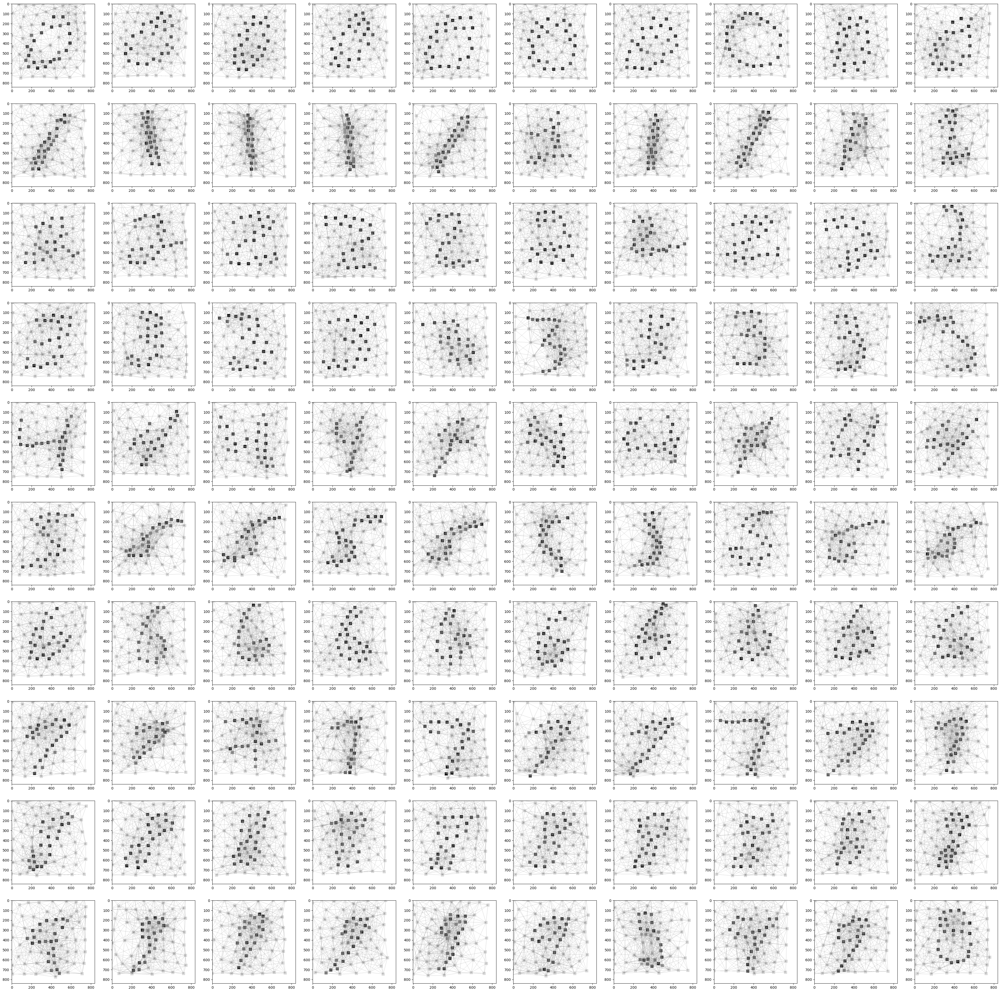

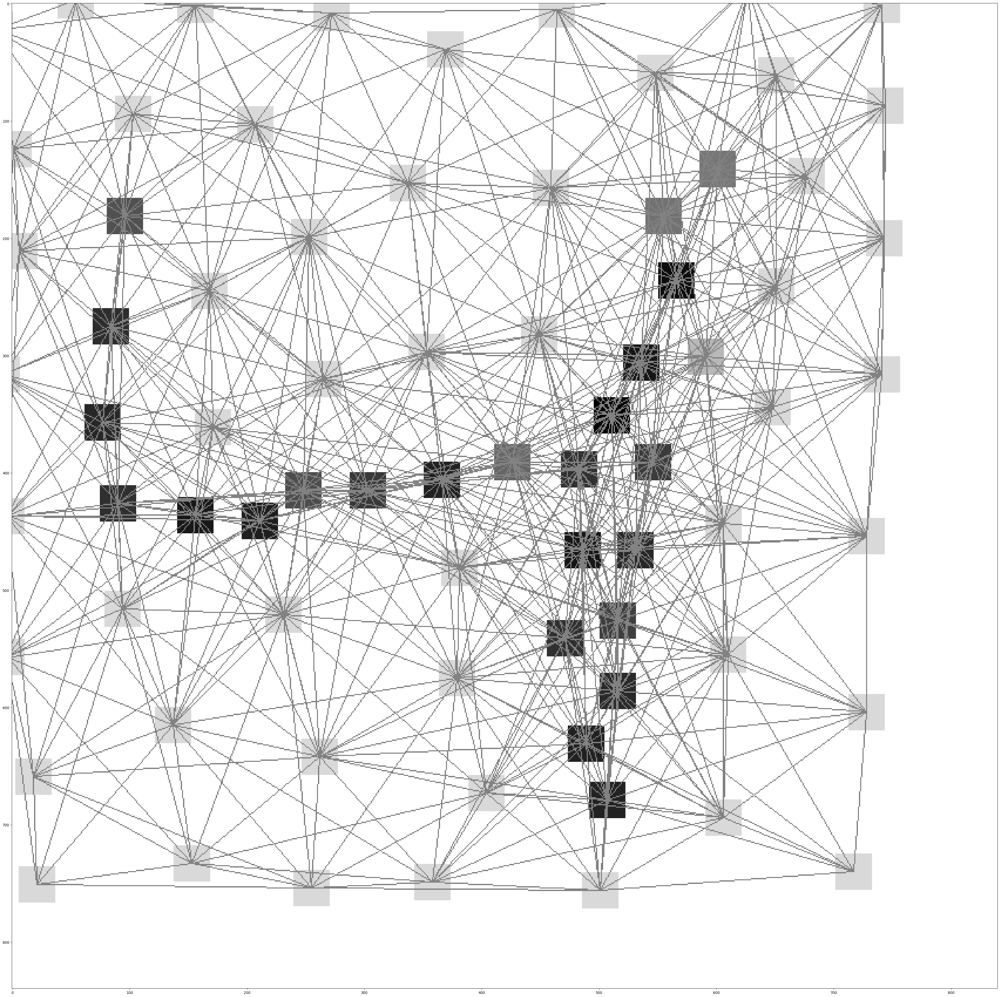

In [70]:
import torch_geometric.data

def superpixels_to_2d_image(rec: torch_geometric.data.Data, scale: int = 30, edge_width: int = 1) -> np.ndarray:
    pos = (rec.pos.clone() * scale).int()

    image = np.zeros((scale * 28, scale * 28, 1), dtype=np.uint8)
    for (color, (x, y)) in zip(rec.x, pos):
        x0, y0 = int(x), int(y)
        x1, y1 = x0 - scale, y0 - scale

        color = int(float(color + 0.15) * 255)
        color = min(color, 255)

        cv2.rectangle(image, (x0, y0), (x1, y1), color, -1)

    for node_ix_0, node_ix_1 in rec.edge_index.T:
        x0, y0 = list(map(int, pos[node_ix_0]))
        x1, y1 = list(map(int, pos[node_ix_1]))

        x0 -= scale // 2
        y0 -= scale // 2
        x1 -= scale // 2
        y1 -= scale // 2

        cv2.line(image, (x0, y0), (x1, y1), 125, edge_width)
    return image


def visualize(
    dataset: list[torch_geometric.data.Data],
    image_name: str,
    examples_per_class: int = 10,
    classes: tuple[int, ...] = tuple(range(10)),
    figsize: tuple[int, int] = (50, 50),
    edge_width: int = 1,
) -> None:
    class_to_examples = {class_ix: [] for class_ix in classes}

    for record in dataset:
        enough = True
        for examples in class_to_examples.values():
            if len(examples) < examples_per_class:
                enough = False
        if enough:
            break

        class_ix = int(record.y)

        if class_ix not in class_to_examples:
            continue

        if len(class_to_examples[class_ix]) == examples_per_class:
            continue

        if len(class_to_examples[class_ix]) > examples_per_class:
            raise RuntimeError

        class_to_examples[class_ix].append(superpixels_to_2d_image(record, edge_width=edge_width))

    plt.figure(figsize=figsize)
    subplot_ix = 1
    for class_ix in classes:
        for example in class_to_examples[class_ix]:
            plt.subplot(len(classes), examples_per_class, subplot_ix)
            subplot_ix += 1
            plt.imshow(example, cmap=plt.cm.binary)
    plt.savefig(image_name)


if __name__ == "__main__":
    train_dataset, test_dataset = build_mnist_superpixels_dataset(train=True), build_mnist_superpixels_dataset(train=False)

    visualize(
        train_dataset,
        image_name="all_classes.jpg",
    )

    visualize(
        train_dataset,
        image_name="one_class.jpg",
        classes=(4,),
        examples_per_class=1,
    )


/opt/conda/lib/python3.10/site-packages/networkx/drawing/nx_pylab.py:437: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


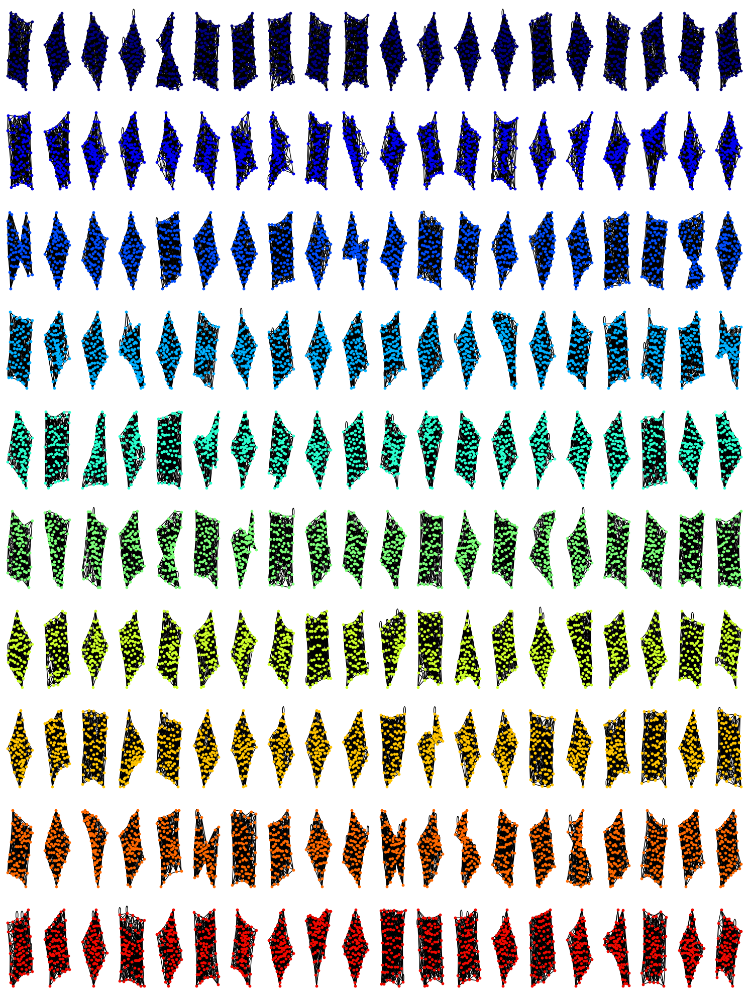

In [73]:
# Function to visualize a single graph
def visualize_graph(data, ax):
    edge_index = data.edge_index
    G = nx.Graph()
    G.add_nodes_from(range(data.num_nodes))
    edges = edge_index.t().tolist()
    G.add_edges_from(edges)
    pos = nx.spring_layout(G)
    
    # Convert node labels to colors using a colormap
    cmap = plt.get_cmap('jet')
    node_colors = [cmap(i / 10) for i in range(10)]  
    
    nx.draw(G, pos, node_color=node_colors[data.y.item()], node_size=10, with_labels=False, ax=ax)

# Visualize the graphs for each class
num_classes = 10
num_images_per_class = 20
fig, axs = plt.subplots(num_classes, num_images_per_class, figsize=(15, 20))  # Create a grid of subplots

for class_label in range(num_classes):
    class_data = []  # List to store data for the current class
    for i in range(num_images_per_class):
        # Filter data for the current class label
        class_data.append(dataset[dataset.y == class_label][i])
    
    for i, ax in enumerate(axs[class_label]):
        visualize_graph(class_data[i], ax)

plt.tight_layout()
plt.show()


In [80]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
import time

# Define the CNN model
class CNNModel(nn.Module):
    def __init__(self):
        super(CNNModel, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.fc = nn.Linear(256, 10)

    def forward(self, x):
        x = F.relu(F.max_pool2d(self.conv1(x), 2))
        x = F.relu(F.max_pool2d(self.conv2(x), 2))
        x = F.relu(F.max_pool2d(self.conv3(x), 2))
        x = F.relu(F.max_pool2d(self.conv4(x), 2))
        x = x.view(-1, 256)  # Adjusted the size here
        x = self.fc(x)
        return F.log_softmax(x, dim=1)



# Load MNIST dataset
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.1307,), (0.3081,))
])

train_loader = torch.utils.data.DataLoader(
    datasets.MNIST('../data', train=True, download=True,
                   transform=transform),
    batch_size=64, shuffle=True)

test_loader = torch.utils.data.DataLoader(
    datasets.MNIST('../data', train=False, transform=transform),
    batch_size=1000, shuffle=True)

# Initialize CNN model and optimizer
cnn_model = CNNModel().to(device)
cnn_optimizer = optim.Adam(cnn_model.parameters(), lr=0.001)

# Training loop for CNN model
cnn_model.train()
start_time = time.time()
for epoch in range(10):
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)
        cnn_optimizer.zero_grad()
        output = cnn_model(data)
        loss = F.nll_loss(output, target)
        loss.backward()
        cnn_optimizer.step()

end_time = time.time()
cnn_training_time = end_time - start_time

# Evaluation on test set
cnn_model.eval()
test_loss = 0
correct = 0
with torch.no_grad():
    for data, target in test_loader:
        data, target = data.to(device), target.to(device)
        output = cnn_model(data)
        test_loss += F.nll_loss(output, target, reduction='sum').item()  # sum up batch loss
        pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
        correct += pred.eq(target.view_as(pred)).sum().item()

test_loss /= len(test_loader.dataset)

print('CNN Test Accuracy: {:.2f}%'.format(100. * correct / len(test_loader.dataset)))
print('CNN Training Time: {:.2f} seconds'.format(cnn_training_time))


CNN Test Accuracy: 99.08%
CNN Training Time: 138.78 seconds


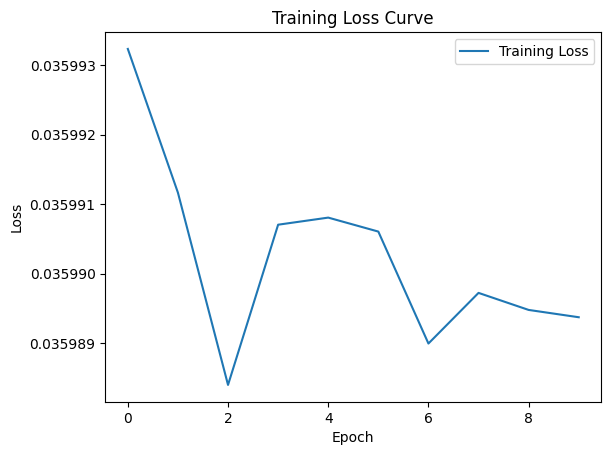

In [131]:
# Check if GPU is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize model and optimizer
model = GNNModel(dataset.num_features, hidden_dim=64, num_classes=10, num_layers=5).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.01)

# Lists to store loss values
train_losses = []

# Training loop
model.train()
for epoch in range(10):
    running_loss = 0.0
    for data in loader:
        data = data.to(device)  # Move data to GPU
        optimizer.zero_grad()
        out = model(data)
        loss = F.nll_loss(out, data.y[data.batch]) 
        loss.backward()
        optimizer.step()
        
        # Accumulate loss
        running_loss += loss.item()
    
    # Calculate average loss for the epoch
    epoch_loss = running_loss / len(loader.dataset)
    train_losses.append(epoch_loss)
    
   

# Plot loss curve
plt.plot(train_losses, label='Training Loss')
plt.title('Training Loss Curve')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()



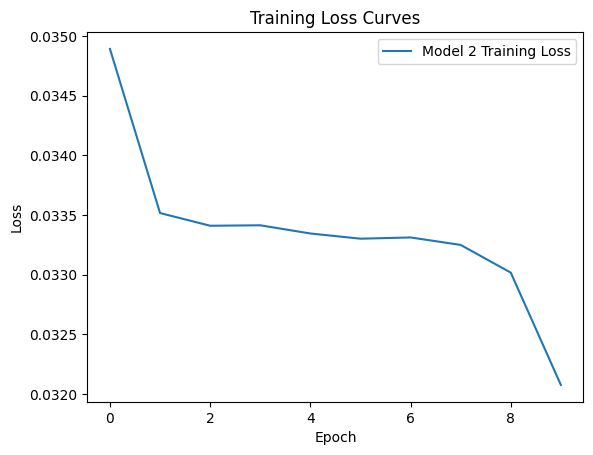

In [134]:
# Check if GPU is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#Second set of hyperparameters
model2 = GNNModel(dataset.num_features, hidden_dim=128, num_classes=10, num_layers=3).to(device)
optimizer2 = optim.Adam(model2.parameters(), lr=0.001)

train_losses2 = []

# Training loop for model 2
model2.train()
for epoch in range(10):
    running_loss = 0.0
    for data in loader:
        data = data.to(device)
        optimizer2.zero_grad()
        out = model2(data)
        loss = F.nll_loss(out, data.y[data.batch]) 
        loss.backward()
        optimizer2.step()
        
        # Accumulate loss
        running_loss += loss.item()
    
    # Calculate average loss for the epoch
    epoch_loss = running_loss / len(loader.dataset)
    train_losses2.append(epoch_loss)
    
   
#plotting loss curve

plt.plot(train_losses2, label='Model 2 Training Loss')
plt.title('Training Loss Curves')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()
